In [8]:

import re,glob,os,json,copy
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import matplotlib.patheffects as path_effects
from matplotlib.gridspec import GridSpec

from scipy.stats import gaussian_kde
from matplotlib.gridspec import GridSpec
import matplotlib.patches as mpatches

import baltic as bt

typeface='Helvetica Neue'
mpl.rcParams['font.weight']=300
mpl.rcParams['axes.labelweight']=300
mpl.rcParams['font.family']=typeface
mpl.rcParams['font.size']=22
mpl.rcParams['pdf.fonttype']=42


In [ ]:
HCoV
GI
GIIb
GIIa
DCOV


Tree height: 0.113106
Tree length: 0.514948

Numbers of objects in tree: 208 (101 nodes and 107 leaves)


Tree height: 0.059037
Tree length: 0.259721

Numbers of objects in tree: 192 (91 nodes and 101 leaves)


Tree height: 0.190457
Tree length: 0.681105
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.189718
Tree length: 0.544172
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)


Tree height: 0.077515
Tree length: 0.293632
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.121563
Tree length: 0.401951
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)



/var/folders/xt/vz8fznds4hdbfcxyds95mtp00000gp/T/ipykernel_56791/3146108496.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
feat NOT subset; don't know how to subset; dropped
fond NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


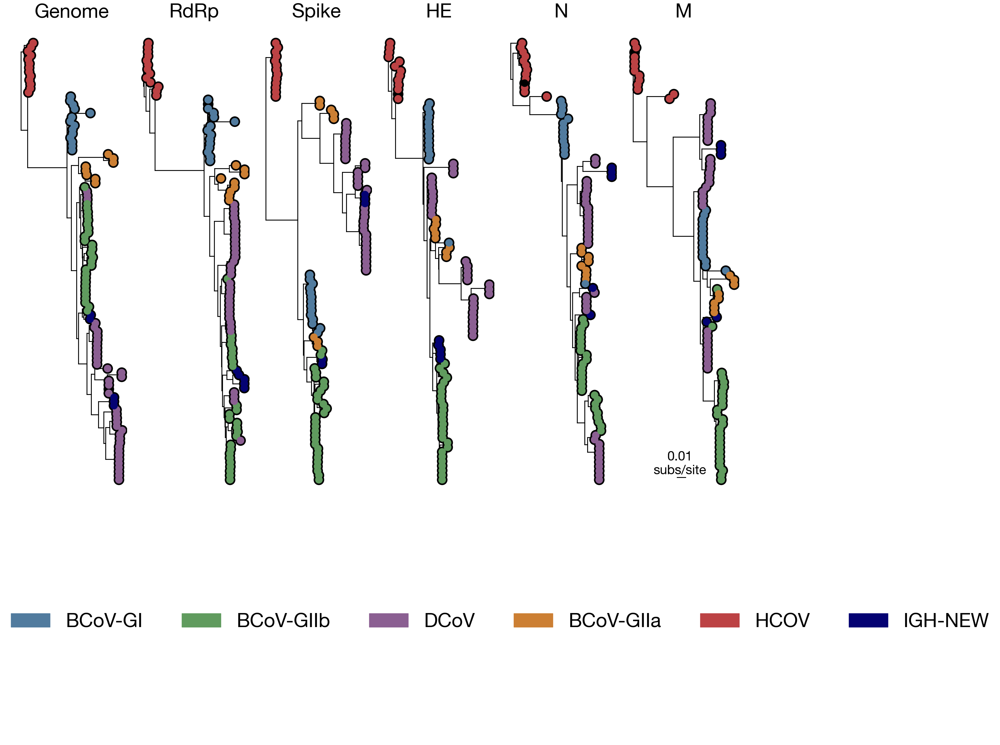

In [10]:
import csv
import baltic as bt
import os
import matplotlib.pyplot as plt

# 1) Read the CSV and build mappings
tip_colours     = {}   # full tip label → colour
name_colours    = {}   # group name     → colour
csv_path = '/Volumes/LaCie/Cat/tree_bcov/Tips_color.csv'
with open(csv_path) as f:
    reader = csv.DictReader(f)
    for row in reader:
        tip_colours[row['label']]  = row['Color']
        name_colours[row['name']]  = row['Color']

# 2) Your tree‐plotting setup
base_path = '/Volumes/LaCie/Cat/tree_bcov/'
segments  = ['Genome','RdRp','Spike','HE','N','M']

fig = plt.figure(figsize=(40, 30))
gs  = GridSpec(2, 8, height_ratios=[2, 1],
               wspace=0.1, hspace=0.0001)

for t, seg in enumerate(segments):
    ax = fig.add_subplot(gs[0, t])
    tree_path = os.path.join(base_path, f'{seg}.pruned.tree')
    ll = bt.loadNewick(tree_path)
    ll.sortBranches()
    ll.treeStats()
    

    # colour by exact tip name
    tip_colour = lambda k: tip_colours.get(k.name, 'black')

    # plot branches + points + labels
    ll.plotTree(ax,
                x_attr=lambda k: k.x,
                y_attr=lambda k: k.y,
                width=2)
    ll.plotPoints(ax,
                  x_attr=lambda k: k.x,
                  y_attr=lambda k: k.y,
                  size=300,
                  colour=tip_colour)
    #ll.addText(ax,
     #          x_attr=lambda k: k.x + 0.007,
     #          y_attr=lambda k: k.y,
      #         text=lambda k: k.name.split('|')[0],
      #         ha='left', va='center', size=10,
      #         zorder=1, clip_on=False)

    ax.set_title(seg, size=45)
    ax.set_xticks([]); ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

# 3) Add a single legend across the bottom row
legend_ax = fig.add_subplot(gs[1, :])
legend_ax.axis('off')
handles = [mpatches.Patch(color=c, label=name)
           for name, c in name_colours.items()]
legend_ax.legend(handles=handles,
                 title='',
                 loc='center',
                 ncol=len(name_colours),
                 frameon=False,
                 fontsize=45,
                 title_fontsize=16)

# draw scale bar
L, x0, y0 = 0.01, 0.053, 1.0
ax.plot([x0, x0+L], [y0, y0], color='k', lw=2)
ax.text(x0 + L/3, y0 + 0.2, f'{L}\nsubs/site',
ha='center', va='bottom', size=30)

plt.tight_layout()

plt.savefig('/Volumes/LaCie/Cat/tree_bcov/BCOV_Fig1.pdf',bbox_inches='tight',dpi=300)
plt.savefig('/Volumes/LaCie/Cat/tree_bcov/BCOV_Fig1.eps',bbox_inches='tight',dpi=300)
plt.savefig('/Volumes/LaCie/Cat/tree_bcov/BCOV_Fig1.png',bbox_inches='tight',dpi=500)

plt.show()


Tree height: 0.113106
Tree length: 0.514948

Numbers of objects in tree: 208 (101 nodes and 107 leaves)


Tree height: 0.189718
Tree length: 0.544172
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)


Tree height: 0.121563
Tree length: 0.401951
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)


Tree height: 0.077515
Tree length: 0.293632
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.190457
Tree length: 0.681105
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.059037
Tree length: 0.259721

Numbers of objects in tree: 192 (91 nodes and 101 leaves)



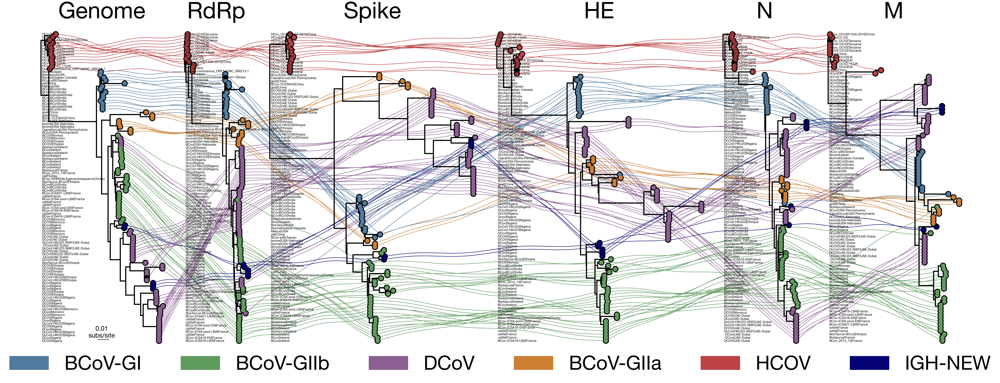

In [191]:
import os
import glob
import csv
import numpy as np
import baltic as bt
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.patches as mpatches

# ─── 1) Load your tip colours ────────────────────────────────────────────────────
csv_path = '/Volumes/LaCie/Cat/tree_bcov/Tips_color.csv'
tip_colours  = {}  # full tip label → colour
name_colours = {}  # group name     → colour
with open(csv_path) as f:
    reader = csv.DictReader(f)
    for row in reader:
        tip_colours[row['label']] = row['Color']
        name_colours[row['name']] = row['Color']


# ─── 2) Build the tanglegram ───────────────────────────────────────────────────
def subplot_tanglegram(ax):
    # load & prep all trees
    trees = {}
    base_path = '/Volumes/LaCie/Cat/tree_bcov/'
    for tfile in glob.glob(os.path.join(base_path, '*.pruned.tree')):
        seg = os.path.basename(tfile).split('.')[0]
        ll = bt.loadNewick(tfile)
        ll.treeStats()
        ll = ll.collapseBranches(lambda k: k.length == 0.0)
        ll = ll.reduceTree([k for k in ll.getExternal()
                             if k.is_leaf() and 'NJ' not in k.name])
        ll.sortBranches()
        trees[seg] = ll

    # ensure this matches your filenames exactly!
    order   = ['Genome', 'RdRp', 'Spike', 'HE', 'N', 'M']
    tallest = max(t.ySpan for t in trees.values())
    offset  = 0.0
    space   = 0.02

    # draw scale bar
    L, x0, y0 = 0.01, 0.053, 1.0
    ax.plot([x0, x0+L], [y0, y0], color='k', lw=2)
    ax.text(x0 + L/3, y0 + 0.2, f'{L}\nsubs/site',
            ha='center', va='bottom', size=30)

    # main loop: each tree + wiggle connectors
    for i, seg in enumerate(order):
        ll = trees[seg]

        # safe x/y: treat None as 0.0
        x_attr = lambda k: (k.x or 0.0) + offset
        y_attr = lambda k: (k.y or 0.0) * (tallest / ll.ySpan)

        tip_colour = lambda k: tip_colours.get(k.name, 'black')

        # plot tree
        ll.plotTree(ax,   x_attr=x_attr, y_attr=y_attr, width=5)
        ll.plotPoints(ax, x_attr=x_attr, y_attr=y_attr,
                      size=400, colour=tip_colour)
        ll.addText(
            ax,
            x_attr=lambda k: offset + 0.001,
            y_attr=y_attr,
            text=lambda k: f"{k.name.split('|')[1]}|{k.name.split('|')[-2]}",
            ha='left', va='center', size=15
        )
        ax.text(offset + ll.treeHeight/2, tallest+5,
                seg, ha='center', size=105)
       
         

        # wiggle‐line connectors to next tree
        if i < len(order)-1:
            next_ll = trees[order[i+1]]
            next_names = {w.name for w in next_ll.getExternal()}

            for tip in ll.getExternal():
                if tip.name not in next_names:
                    continue

                # endpoints
                x1, y1 = x_attr(tip), y_attr(tip)
                mate = [w for w in next_ll.getExternal() if w.name == tip.name][0]
                x4 = (mate.x or 0.0) + max(x_attr(n) for n in ll.getExternal()) + space
                y2 = (mate.y or 0.0) * (tallest / next_ll.ySpan)

                # interpolate + sine wiggle
                npts = 200
                xs = np.linspace(x1, x4, npts)
                ys_lin = np.linspace(y1, y2, npts)
                amp = tallest * 0.005
                wig = np.sin(np.linspace(0, 4*np.pi, npts))
                ys = ys_lin + wig * amp

                ax.plot(xs, ys,
                        color=tip_colours.get(tip.name, 'grey'),
                        lw=2, alpha=1.0, zorder=0)

        offset += ll.treeHeight + space

    ax.set_xlim(-space/2, offset - space*0.5)
    ax.axis('off')
    return ax


# ─── 3) Draw full figure + legend ───────────────────────────────────────────────
fig = plt.figure(figsize=(70, 25), facecolor='w')
gs  = GridSpec(2, 1, height_ratios=[20, 1], hspace=0.0)
ax  = fig.add_subplot(gs[0, 0])
subplot_tanglegram(ax)

legend_ax = fig.add_subplot(gs[1, 0])
legend_ax.axis('off')
patches = [mpatches.Patch(color=c, label=name)
           for name, c in name_colours.items()]
legend_ax.legend(handles=patches,
                 title="",
                 loc='center',
                 ncol=len(name_colours),
                 frameon=False,
                 fontsize=90,
                 title_fontsize=18)

plt.tight_layout()
#plt.savefig('/Volumes/LaCie/Cat/tree_bcov/tangle_gram_BCOV_Fig1.pdf',bbox_inches='tight',dpi=300)
#plt.savefig('/Volumes/LaCie/Cat/tree_bcov/tangle_gramBCOV_Fig1.eps',bbox_inches='tight',dpi=300)
#plt.savefig('/Volumes/LaCie/Cat/tree_bcov/tangle_gramBCOV_Fig1.png',bbox_inches='tight',dpi=500)
plt.show()


Tree height: 0.113106
Tree length: 0.514948

Numbers of objects in tree: 208 (101 nodes and 107 leaves)


Tree height: 0.189718
Tree length: 0.544172
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)


Tree height: 0.121563
Tree length: 0.401951
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)


Tree height: 0.077515
Tree length: 0.293632
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.190457
Tree length: 0.681105
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)


Tree height: 0.059037
Tree length: 0.259721

Numbers of objects in tree: 192 (91 nodes and 101 leaves)



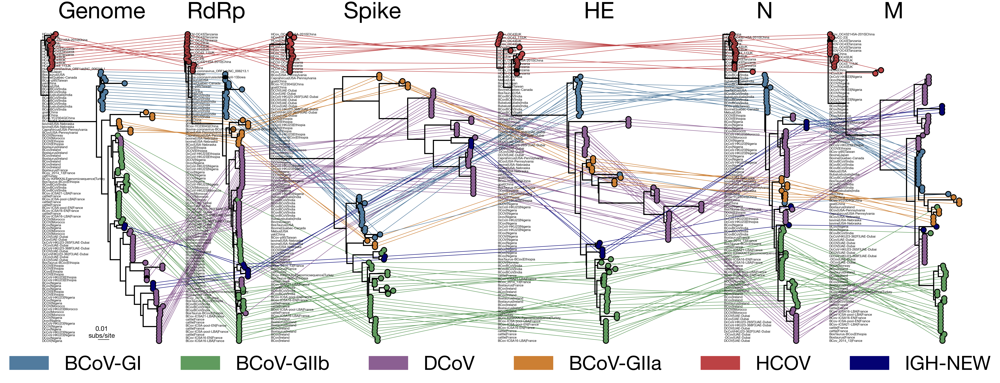

In [193]:
import os
import glob
import csv
import numpy as np
import baltic as bt
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.patches as mpatches

# ─── 1) Load your tip colours ────────────────────────────────────────────────────
csv_path = '/Volumes/LaCie/Cat/tree_bcov/Tips_color.csv'
tip_colours  = {}  # full tip label → colour
name_colours = {}  # group name     → colour
with open(csv_path) as f:
    reader = csv.DictReader(f)
    for row in reader:
        tip_colours[row['label']] = row['Color']
        name_colours[row['name']] = row['Color']


# ─── 2) Build the tanglegram ───────────────────────────────────────────────────
def subplot_tanglegram(ax):
    # load & prep all trees
    trees = {}
    base_path = '/Volumes/LaCie/Cat/tree_bcov/'
    for tfile in glob.glob(os.path.join(base_path, '*.pruned.tree')):
        seg = os.path.basename(tfile).split('.')[0]
        ll = bt.loadNewick(tfile)
        ll.treeStats()
        ll = ll.collapseBranches(lambda k: k.length == 0.0)
        ll = ll.reduceTree([k for k in ll.getExternal()
                             if k.is_leaf() and 'NJ' not in k.name])
        ll.sortBranches()
        trees[seg] = ll

    # ensure this matches your filenames exactly!
    order   = ['Genome', 'RdRp', 'Spike', 'HE', 'N', 'M']
    tallest = max(t.ySpan for t in trees.values())
    offset  = 0.0
    space   = 0.02

    # draw scale bar
    L, x0, y0 = 0.01, 0.053, 1.0
    ax.plot([x0, x0+L], [y0, y0], color='k', lw=2)
    ax.text(x0 + L/3, y0 + 0.2, f'{L}\nsubs/site',
            ha='center', va='bottom', size=30)

    # main loop: each tree + straight connectors
    for i, seg in enumerate(order):
        ll = trees[seg]

        # safe x/y: treat None as 0.0
        x_attr = lambda k: (k.x or 0.0) + offset
        y_attr = lambda k: (k.y or 0.0) * (tallest / ll.ySpan)

        tip_colour = lambda k: tip_colours.get(k.name, 'black')

        # plot tree
        ll.plotTree(ax,   x_attr=x_attr, y_attr=y_attr, width=5)
        ll.plotPoints(ax, x_attr=x_attr, y_attr=y_attr,
                      size=400, colour=tip_colour)
        ll.addText(
            ax,
            x_attr=lambda k: offset + 0.001,
            y_attr=y_attr,
            text=lambda k: f"{k.name.split('|')[1]}|{k.name.split('|')[-2]}",
            ha='left', va='center', size=15
        )
        ax.text(offset + ll.treeHeight/2, tallest+5,
                seg, ha='center', size=105)

        # straight‐line connectors to next tree
        if i < len(order)-1:
            next_ll   = trees[order[i+1]]
            next_names = {w.name for w in next_ll.getExternal()}

            for tip in ll.getExternal():
                if tip.name not in next_names:
                    continue

                # endpoints
                x1, y1 = x_attr(tip), y_attr(tip)
                mate = [w for w in next_ll.getExternal() if w.name == tip.name][0]
                x4 = (mate.x or 0.0) + max(x_attr(n) for n in ll.getExternal()) + space
                y2 = (mate.y or 0.0) * (tallest / next_ll.ySpan)

                # linear interpolation
                npts = 200
                xs   = np.linspace(x1, x4, npts)
                ys   = np.linspace(y1, y2, npts)

                ax.plot(xs, ys,
                        color=tip_colours.get(tip.name, 'grey'),
                        lw=2, alpha=1.0, zorder=0)

        offset += ll.treeHeight + space

    ax.set_xlim(-space/2, offset - space*0.5)
    ax.axis('off')
    return ax


# ─── 3) Draw full figure + legend ───────────────────────────────────────────────
fig = plt.figure(figsize=(70, 25), facecolor='w')
gs  = GridSpec(2, 1, height_ratios=[20, 1], hspace=0.0)
ax  = fig.add_subplot(gs[0, 0])
subplot_tanglegram(ax)

legend_ax = fig.add_subplot(gs[1, 0])
legend_ax.axis('off')
patches = [mpatches.Patch(color=c, label=name)
           for name, c in name_colours.items()]
legend_ax.legend(handles=patches,
                 title="",
                 loc='center',
                 ncol=len(name_colours),
                 frameon=False,
                 fontsize=90,
                 title_fontsize=18)

plt.tight_layout()
plt.show()


Processing segment: Genome

Tree height: 0.122172
Tree length: 0.534358

Numbers of objects in tree: 214 (104 nodes and 110 leaves)

Processing segment: ORF1ab

Tree height: 0.059037
Tree length: 0.259721

Numbers of objects in tree: 192 (91 nodes and 101 leaves)

Processing segment: Spike

Tree height: 0.190457
Tree length: 0.681105
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)

Processing segment: HE

Tree height: 0.189718
Tree length: 0.544172
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)

Processing segment: N

Tree height: 0.077515
Tree length: 0.293632
strictly bifurcating tree

Numbers of objects in tree: 197 (98 nodes and 99 leaves)

Processing segment: M

Tree height: 0.121563
Tree length: 0.401951
strictly bifurcating tree

Numbers of objects in tree: 189 (94 nodes and 95 leaves)



/var/folders/xt/vz8fznds4hdbfcxyds95mtp00000gp/T/ipykernel_64202/741837919.py:91: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


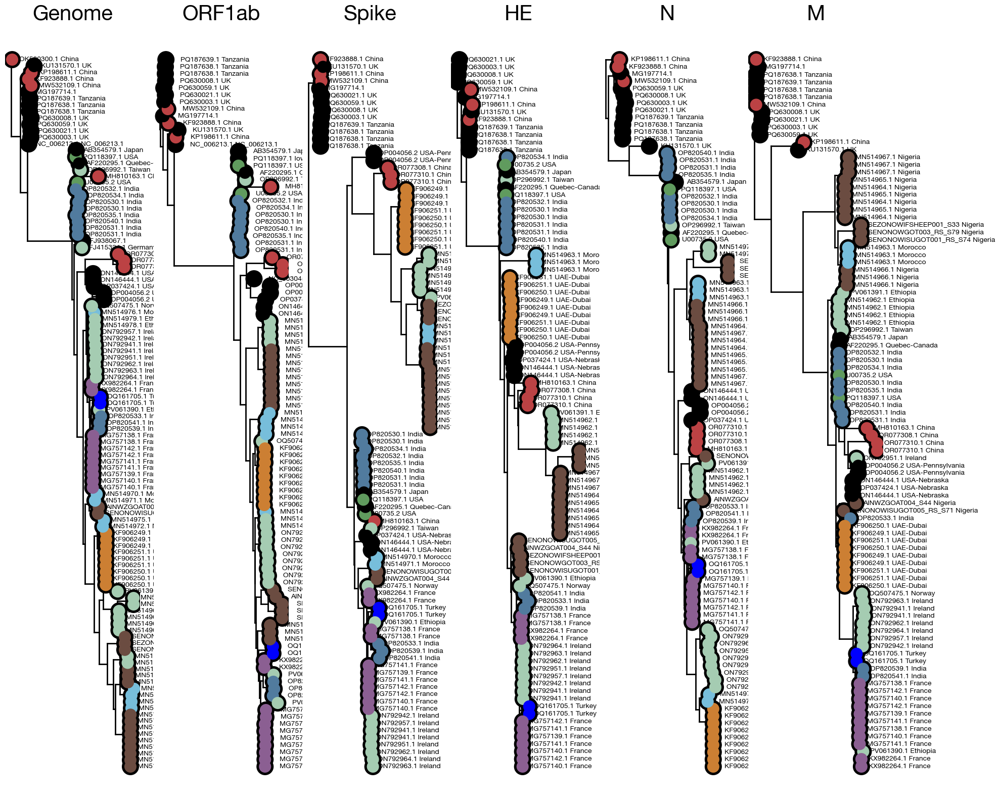

In [75]:
import baltic as bt
import os
import glob
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib import gridspec

# Base directory where your rooted trees are stored
base_path = '/Volumes/LaCie/Cat/tree_bcov/'

# List of segments/filenames (without extension)
segments = ['Genome','ORF1ab', 'Spike', 'HE', 'N', 'M']

# Define colours for tip annotation based on some expected key in tip names.
tip_colours = 

# Create a figure with one row and as many columns as segments.
fig = plt.figure(figsize=(30, 30))
gs = gridspec.GridSpec(2, 8, height_ratios=[2, 1], wspace=0.1, hspace=0.0001)  # Setup figure with grid

# Loop through segments, load each rooted tree, sort branches, and plot it.
for t, seg in enumerate(segments):
    tree_path = os.path.join(base_path, f'{seg}.pruned.tree')
    print(f"Processing segment: {seg}")
    
    # Create a subplot for this tree
    ax = plt.subplot(gs[0, t])
    
    # Load the rooted tree
    ll = bt.loadNewick(tree_path)
    
    # Sort branches (if needed for a clean plot)
    ll.sortBranches()
    ll.treeStats()
    
    # Define coordinate functions.
    # Here we assume that the tree is already rooted and that each node has attributes:
    #   - k.x : branch length (horizontal coordinate)
    #   - k.y : vertical position of the tip/node
    x_attr = lambda k: k.x  # use branch lengths as-is
    y_attr = lambda k: k.y  # use the provided y positions

    # Function to choose tip colour.
    # If the tip name is in the format 'ID|...|Country', split and use the country to pick the colour.
    tip_colour = lambda k: tip_colours.get(k.name.split('|')[-2], 'black') if '|' in k.name else 'black'

    # Plot the tree (branch lines)
    ll.plotTree(ax, x_attr=x_attr, y_attr=y_attr, width=2)
    
    # Plot tip points
    ll.plotPoints(ax, x_attr=x_attr, y_attr=y_attr, size=300, colour=tip_colour)
    
    # Add tip labels. A small text_offset is added to the x-coordinate so that the label appears right next to the tip.
    # The text is drawn with a high zorder and clip_on=False to ensure it is visible over adjacent subplots.
    text_offset = 0.007
    ll.addText(ax,
               x_attr=lambda k: k.x + text_offset,
               y_attr=y_attr,
               text=lambda k: k.name if '|' not in k.name else f'{k.name.split("|")[0]} {k.name.split("|")[-2]}',
               ha='left', va='center', size=10,
               zorder=1, clip_on=False)
    
    # Optionally add a title for each subplot
    ax.set_title(seg, size=30)
    
    # Clean up the axis appearance
    ax.set_xticks([])
    ax.set_xticklabels([])
    ax.set_yticks([])
    ax.set_yticklabels([])
    for spine in ax.spines.values():
        spine.set_visible(False)

plt.tight_layout()
#plt.savefig('/Users/s2059633/Downloads/BCOV/BCOV_Fig1.pdf',bbox_inches='tight',dpi=300)
#plt.savefig('/Users/s2059633/Downloads/BCOV/BCOV_Fig1.eps',bbox_inches='tight',dpi=300)
#plt.savefig('/Users/s2059633/Downloads/BCOV/BCOV_Fig1.png',bbox_inches='tight',dpi=500)


plt.show()